In [4]:
import os
import glob
import random
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [5]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [6]:
cd /content/drive/MyDrive/Data-20240107T131020Z-001/Data


/content/drive/MyDrive/Data-20240107T131020Z-001/Data


In [7]:
# Assigning a file path to the variable 'train_folder'
train_folder = '/content/drive/MyDrive/Data-20240107T131020Z-001/Data/train'


In [8]:
# Initializing an empty list to store file paths of images
images = []

# Iterating over folders in the specified training directory
for folder in os.listdir(train_folder):
    # Iterating over images in each folder
    for image in os.listdir(train_folder + '/' + folder):
        # Creating the full file path for each image and appending it to the 'images' list
        images.append(os.path.join(train_folder, folder, image))


In [9]:
# Creating a new figure object for plotting with figure number 1
fig = plt.figure(1, figsize=(15, 9))


<Figure size 1500x900 with 0 Axes>

<ipython-input-10-de228531392c>:22: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(4, 4, n)


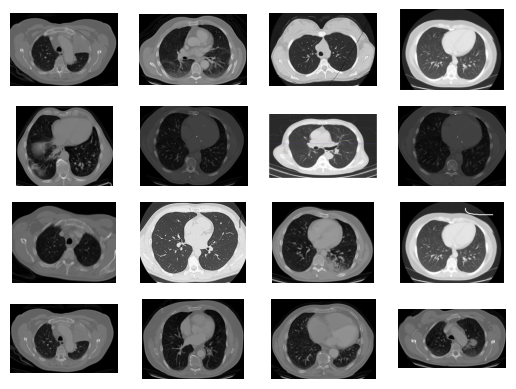

In [10]:
# Setting the title for the overall figure
fig.suptitle('Data overview', fontsize=25)

# Turning off axis labels for the entire figure
plt.axis('off')

# Initializing a counter variable
n = 0

# Looping 16 times to display a 4x4 grid of randomly chosen images
for i in range(16):
    # Incrementing the counter
    n += 1

    # Randomly selecting an image file path from the 'images' list
    random_img = random.choice(images)

    # Loading the image using TensorFlow's utility function
    imgs = tf.keras.utils.load_img(random_img)

    # Creating a subplot in a 4x4 grid, and setting its position in the figure
    plt.subplot(4, 4, n)

    # Turning off axis labels for each subplot
    plt.axis('off')

    # Displaying the loaded image in the subplot
    plt.imshow(imgs)

# Displaying the entire figure with the 4x4 grid of images
plt.show()


In [11]:
# Listing the directories present in the specified training data path
class_dirs = os.listdir("/content/drive/MyDrive/Data-20240107T131020Z-001/Data/train")


In [12]:
# Initializing an empty dictionary to store image paths for each class
image_dict = {}

# Initializing an empty dictionary to store the count of images for each class
count_dict = {}


In [13]:
# Iterating through each class directory
for cls in class_dirs:
    # Using glob to get a list of file paths for all images in the current class directory
    file_paths = glob.glob(f'/content/drive/MyDrive/Data-20240107T131020Z-001/Data/train/{cls}/*')

    # Storing the count of images for the current class in the count dictionary
    count_dict[cls] = len(file_paths)

    # Randomly selecting an image path from the list for the current class
    image_path = random.choice(file_paths)

    # Loading the selected image using TensorFlow's utility function and storing it in the image dictionary
    image_dict[cls] = tf.keras.utils.load_img(image_path)


In [14]:
# Listing the directories present in the specified testing data path
class_dirs_test = os.listdir("/content/drive/MyDrive/Data-20240107T131020Z-001/Data/test")


In [15]:
image_dict_test ={}
count_dict_test= {}

In [16]:
# Iterating through each class directory in the testing data
for cls in class_dirs_test:
    # Using glob to get a list of file paths for all images in the current class directory for testing
    file_paths_test = glob.glob(f"/content/drive/MyDrive/Data-20240107T131020Z-001/Data/test/{cls}/*")

    # Storing the count of images for the current class in the testing count dictionary
    count_dict_test[cls] = len(file_paths_test)

    # Randomly selecting an image path from the list for the current class in testing
    image_path = random.choice(file_paths_test)

    # Loading the selected image using TensorFlow's utility function and storing it in the testing image dictionary
    image_dict_test[cls] = tf.keras.utils.load_img(image_path)


In [17]:
plt.figure(figsize = (15,7))

<Figure size 1500x700 with 0 Axes>

<Figure size 1500x700 with 0 Axes>

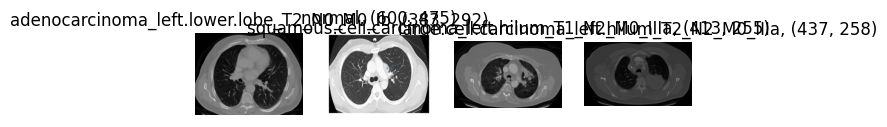

In [18]:
# Iterating through the items (class, image) in the training image dictionary
for i, (cls, img) in enumerate(image_dict.items()):
    # Creating a subplot with one row and four columns
    ax = plt.subplot(1, 4, i+1)

    # Displaying the image in the current subplot
    plt.imshow(img)

    # Setting the title for the current subplot with class name and image size
    plt.title(f"{cls}, {img.size}")

    # Turning off axis labels for the current subplot
    plt.axis("off")


Count of training samples per class:
                                               class  count
0        adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib    195
1                                            normal    148
2  squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa    155
3     large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa    115 



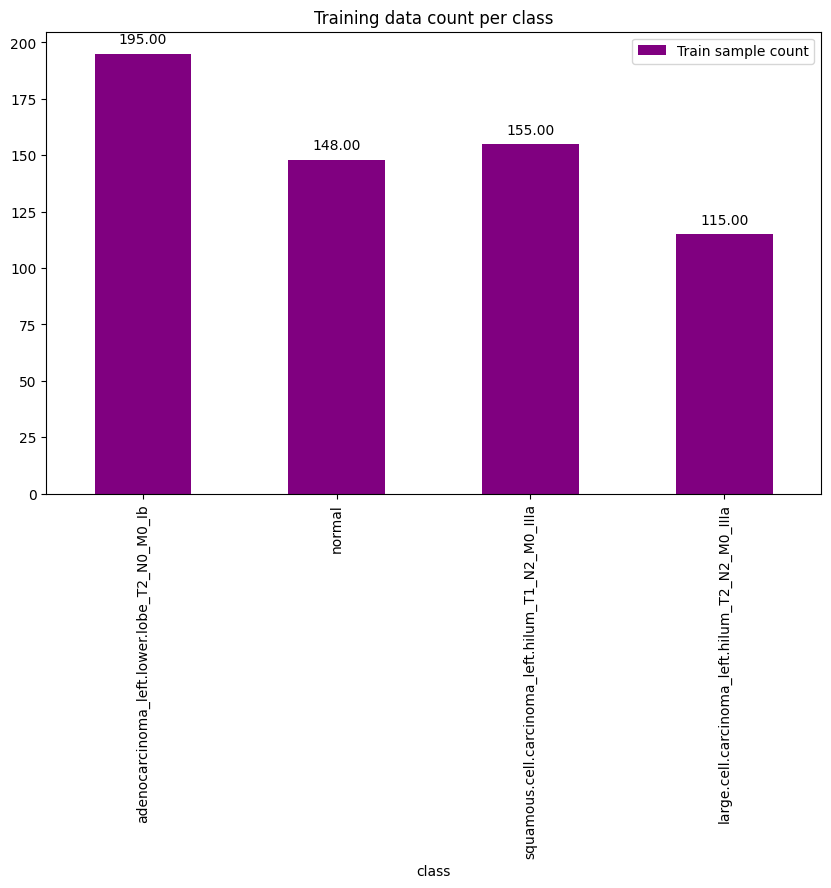

In [19]:
# Creating a DataFrame from the training count dictionary
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),
    "count": count_dict.values(),
})

# Printing the count of training samples per class
print("Count of training samples per class:\n", df_count_train, "\n")

# Plotting a bar chart for the training data count per class
b = df_count_train.plot.bar(
    x='class',
    y='count',
    title="Training data count per class",
    label='Train sample count',
    color='purple',
    figsize=(10, 6)
)

# Annotating each bar in the bar chart with its height
for q in b.patches:
    b.annotate(
        f'{q.get_height():0.2f}',
        (q.get_x() + q.get_width() / 2., q.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),
        textcoords='offset points'
    )

# Displaying the bar chart
plt.show()


Count of testing samples per class:
                      class  count
0                   normal     54
1  squamous.cell.carcinoma     90
2           adenocarcinoma    120
3     large.cell.carcinoma     51 



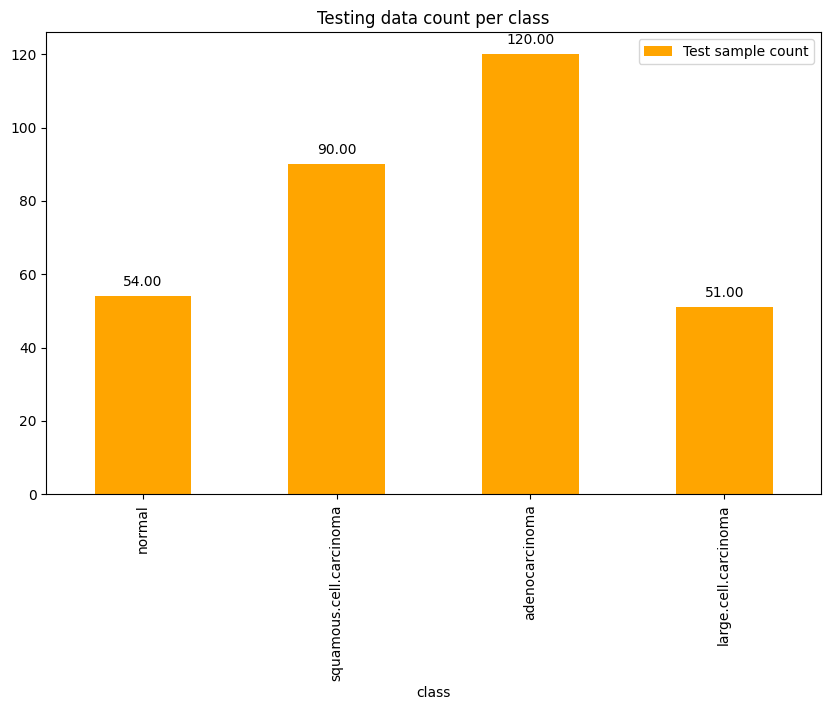

In [20]:
# Creating a DataFrame from the testing count dictionary
df_count_test = pd.DataFrame({
    "class": count_dict_test.keys(),
    "count": count_dict_test.values(),
})

# Printing the count of testing samples per class (Note: It seems there's a typo here; it should be df_count_test instead of df_count_train)
print("Count of testing samples per class:\n", df_count_test, "\n")

# Plotting a bar chart for the testing data count per class
a = df_count_test.plot.bar(
    x='class',
    y='count',
    title="Testing data count per class",
    label='Test sample count',
    color='orange',
    figsize=(10, 6)
)

# Annotating each bar in the bar chart with its height
for p in a.patches:
    a.annotate(
        f'{p.get_height():0.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),
        textcoords='offset points'
    )

# Displaying the bar chart
plt.show()


In [21]:
train_dir = '/content/drive/MyDrive/Data-20240107T131020Z-001/Data/train'

In [22]:
test_dir = '/content/drive/MyDrive/Data-20240107T131020Z-001/Data/test'

In [23]:
validation_dir ='/content/drive/MyDrive/Data-20240107T131020Z-001/Data/valid'

In [24]:
# Setting the desired image size for training
image_size = (256, 256)

# Creating a TensorFlow image dataset from the specified training directory
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_dir,          # Specify the path to the training directory
    label_mode='categorical',     # Using categorical labels
    batch_size=32,                 # Setting the batch size to 32
    image_size=image_size,        # Resizing images to the specified size
    seed=2022,                    # Setting a seed for reproducibility
    validation_split=None,        # No validation split is specified
    shuffle=True                  # Shuffling the dataset
)


Found 613 files belonging to 4 classes.


In [25]:
# Creating a TensorFlow image dataset from the specified testing directory
test_ds = tf.keras.utils.image_dataset_from_directory(
    directory=test_dir,           # Specify the path to the testing directory
    label_mode='categorical',     # Using categorical labels
    batch_size=32,                 # Setting the batch size to 32
    image_size=image_size,        # Resizing images to the specified size
    seed=2022                     # Setting a seed for reproducibility
)


Found 315 files belonging to 4 classes.


In [26]:
# Creating a TensorFlow image dataset from the specified validation directory
valid_ds = tf.keras.utils.image_dataset_from_directory(
    directory=validation_dir,     # Specify the path to the validation directory
    label_mode='categorical',     # Using categorical labels
    batch_size=32,                 # Setting the batch size to 32
    image_size=image_size,        # Resizing images to the specified size
    seed=2022,                    # Setting a seed for reproducibility
    shuffle=False                 # No need to shuffle the validation data
)


Found 72 files belonging to 4 classes.


In [27]:
# Defining the class names for the categorical labels
class_names = ['squamous.cell.carcinoma', 'normal', 'large.cell.carcinoma', 'adenocarcinoma']


In [28]:
# Creating a sequential model using TensorFlow's Sequential API
model = tf.keras.Sequential([
    # Rescaling pixel values to the range [0, 1]
    tf.keras.layers.Rescaling(1./255),

    # Input layer with the specified image size and 3 color channels (RGB)
    tf.keras.layers.InputLayer(input_shape=[image_size[0], image_size[1], 3]),

    # Convolutional layers with ReLU activation and max pooling
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu'),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu'),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), padding='same', activation='relu'),

    # Global average pooling to reduce spatial dimensions
    tf.keras.layers.GlobalAveragePooling2D(),

    # Dense (fully connected) layer with softmax activation for classification
    tf.keras.layers.Dense(4, activation='softmax')
])


In [29]:
# Compiling the model with specified optimizer, loss function, and metrics
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),  # Using the Adam optimizer with a learning rate of 1e-4
    loss=tf.keras.losses.CategoricalCrossentropy(),           # Using categorical crossentropy as the loss function
    metrics=['accuracy', 'Precision', 'Recall']               # Monitoring accuracy, precision, and recall metrics
)


In [30]:
# Setting the directory for TensorBoard logs
log_dir_1 = "logs/Custom_CNN_overfit"

# Creating a TensorBoard callback to visualize training progress
tensorboard_cb = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir_1,          # Specify the directory for TensorBoard logs
    histogram_freq=1            # Logging histogram data every epoch
)


In [31]:
# Training the model using the training dataset, specifying the number of epochs, and including validation data
history = model.fit(
    train_ds,                   # Training dataset
    epochs=20,                  # Number of training epochs
    validation_data=valid_ds,   # Validation dataset
    callbacks=[tensorboard_cb]  # TensorBoard callback for logging
)


Epoch 1/20
20/20 [==============================] - 73s 2s/step - loss: 1.3709 - accuracy: 0.2773 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.3909 - val_accuracy: 0.1806 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
20/20 [==============================] - 5s 222ms/step - loss: 1.3385 - accuracy: 0.2414 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.4164 - val_accuracy: 0.1806 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
20/20 [==============================] - 5s 176ms/step - loss: 1.3265 - accuracy: 0.2414 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.4014 - val_accuracy: 0.1806 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
20/20 [==============================] - 6s 236ms/step - loss: 1.3068 - accuracy: 0.2463 - precision: 1.0000 - recall: 0.0310 - val_loss: 1.3778 - val_accuracy: 0.2222 - val_precision: 1.0000 - val_recall: 0.0556
Epoch 5/20
20/20 [==============================] - 5s 177

In [32]:
def plot_acc_loss(model_history, n_epochs):

    # Creating a subplot with two plots side by side
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    ax = axes.ravel()

    # Plotting accuracy for training and validation
    ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['accuracy']], label='Train', color='b')
    ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['val_accuracy']], label='Validation', color='r')
    ax[0].set_title('Accuracy vs. Epoch', fontsize=15)
    ax[0].set_ylabel('Accuracy', fontsize=15)
    ax[0].set_xlabel('Epoch', fontsize=15)
    ax[0].legend()

    # Plotting loss for training and validation
    ax[1].plot(range(0, n_epochs), model_history.history['loss'], label='Train', color='b')
    ax[1].plot(range(0, n_epochs), model_history.history['val_loss'], label='Validation', color='r')
    ax[1].set_title('Loss vs. Epoch', fontsize=15)
    ax[1].set_ylabel('Loss', fontsize=15)
    ax[1].set_xlabel('Epoch', fontsize=15)
    ax[1].legend()

    # Displaying the plots
    plt.show()


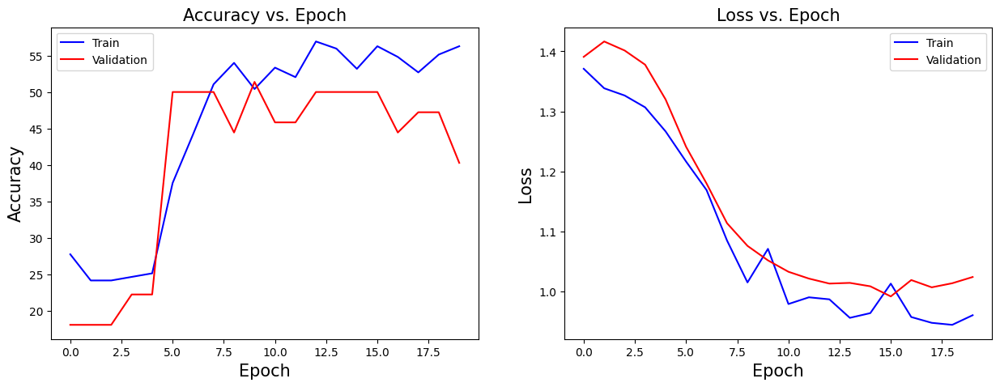

In [33]:
# Plotting accuracy and loss using the custom function
plot_acc_loss(history, n_epochs=20)


In [34]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 input_1 (InputLayer)        multiple                  0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      18496     
                                                        

In [35]:
# Initializing an empty list to store file paths of test images
test_images = []

# Iterating over folders in the specified testing directory
for folder in os.listdir(test_dir):
    # Iterating over images in each folder
    for image in os.listdir(test_dir + '/' + folder):
        # Creating the full file path for each test image and appending it to the 'test_images' list
        test_images.append(os.path.join(test_dir, folder, image))


In [36]:
def grid_test_model(model_name):

    # Creating a figure with 2 rows and 4 columns for displaying predictions
    fig = plt.figure(1, figsize=(17, 11))
    plt.axis('off')
    n = 0

    # Looping 8 times to display predictions for 8 test images
    for i in range(8):
        n += 1

        # Randomly selecting a test image and resizing it to (256, 256)
        img_0 = tf.keras.utils.load_img(random.choice(test_images))
        img_0 = tf.image.resize(img_0, (256, 256))

        # Expanding dimensions to match the input shape expected by the model
        img_1 = tf.expand_dims(img_0, axis=0)

        # Making predictions using the provided model
        pred = model_name.predict(img_1)
        predicted_label = tf.argmax(pred, 1).numpy().item()

        # Rounding the prediction percentages for each class
        for item in pred:
            item = tf.round((item * 100))

        # Creating subplots for each test image and displaying predictions
        plt.subplot(2, 4, n)
        plt.axis('off')
        plt.title(f'Prediction: {class_names[predicted_label]}\n\n'
                  f'{item[0]}% {class_names[0]}\n'
                  f'{item[1]}% {class_names[1]}\n'
                  f'{item[2]}% {class_names[2]}\n'
                  f'{item[3]}% {class_names[3]}\n')
        plt.imshow(img_0/255)

    # Displaying the figure with test image predictions
    plt.show()


1/1 [==============================] - 1s 586ms/step


<ipython-input-36-43a844070fe7>:28: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 4, n)


1/1 [==============================] - 0s 18ms/step


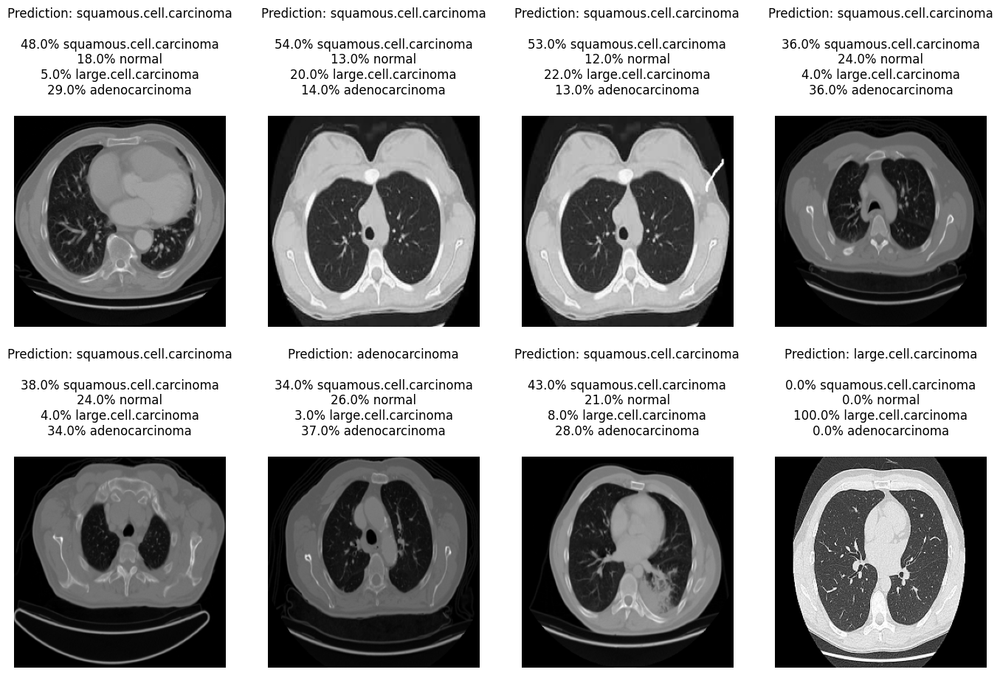

In [37]:
# Calling the function to display predictions for 8 randomly chosen test images using the provided model
grid_test_model(model)


In [38]:
# Specifying the paths for test images in each class
squamous_cell_carcinoma_path = '/content/drive/MyDrive/Data-20240107T131020Z-001/Data/test/squamous.cell.carcinoma'
normal_path = '/content/drive/MyDrive/Data-20240107T131020Z-001/Data/test/normal'
large_cell_carcinoma_path = '/content/drive/MyDrive/Data-20240107T131020Z-001/Data/test/large.cell.carcinoma'
adenocarcinoma_path = '/content/drive/MyDrive/Data-20240107T131020Z-001/Data/test/adenocarcinoma'


In [39]:
def classwise_accuracy(class_path, class_name, model_name):
    # Creating a list to store file paths of images in the specified class
    paths = [class_path + '/' + str(i) for i in os.listdir(class_path)]

    # Initializing variables to count correct and total predictions
    correct = 0
    total = len(paths)

    # Iterating through the images in the specified class
    for i in range(total):
        # Loading and preprocessing the image
        img = tf.keras.utils.load_img(paths[i])
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis=0)

        # Making predictions using the provided model
        pred = model_name.predict(img)

        # Checking if the predicted class index matches the true class index
        if tf.argmax(pred[0]) == class_names.index(f"{class_name}"):
            correct += 1

    # Calculating and printing the accuracy for the specified class
    accuracy = round((correct / total) * 100, 2)
    print(f"Accuracy for class {class_name} is {accuracy}% consisting of {total} images")


In [41]:
# Calculating and printing the accuracy for each class based on the provided model
classwise_accuracy(squamous_cell_carcinoma_path, 'squamous.cell.carcinoma', model)
classwise_accuracy(normal_path, 'normal', model)
classwise_accuracy(large_cell_carcinoma_path, 'large.cell.carcinoma', model)
classwise_accuracy(adenocarcinoma_path, 'adenocarcinoma', model)


1/1 [==============================] - 0s 20ms/step
Accuracy for class squamous.cell.carcinoma is 60.0% consisting of 90 images
1/1 [==============================] - 0s 18ms/step
Accuracy for class normal is 0.0% consisting of 54 images
1/1 [==============================] - 0s 19ms/step
Accuracy for class large.cell.carcinoma is 0.0% consisting of 51 images
1/1 [==============================] - 0s 18ms/step
Accuracy for class adenocarcinoma is 27.5% consisting of 120 images


In [42]:
# Initializing variables to count the number of correct predictions for each class
squamous_cell_carcinoma, normal, large_cell_carcinoma, adenocarcinoma = 0, 0, 0, 0

# Lists to store prediction results for further analysis
l1, l2, l3, l4 = [], [], [], []


In [43]:
# Setting Seaborn plotting parameters for figure size and font scale
sns.set(rc={'figure.figsize': (11.7, 8.27)})
sns.set(font_scale=1.2)


In [44]:
def conf_mat(class_path, pred_list, model_name):
    # Initializing variables to count predictions for each class
    squamous_cell_carcinoma, normal, large_cell_carcinoma, adenocarcinoma = 0, 0, 0, 0

    # Iterating through images in the specified class
    for i in os.listdir(class_path):
        # Loading and preprocessing the image
        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis=0)

        # Making predictions using the provided model
        pred = model_name.predict(img)
        predicted = tf.argmax(pred, 1).numpy().item()

        # Counting predictions for each class
        if predicted == 0:
            squamous_cell_carcinoma += 1
        elif predicted == 1:
            normal += 1
        elif predicted == 2:
            large_cell_carcinoma += 1
        else:
            adenocarcinoma += 1

    # Appending the counts to the provided list
    pred_list.extend([squamous_cell_carcinoma, normal, large_cell_carcinoma, adenocarcinoma])


In [45]:
# Counting predictions for each class and updating the provided lists
conf_mat(squamous_cell_carcinoma_path, l1, model)
conf_mat(normal_path, l2, model)
conf_mat(large_cell_carcinoma_path, l3, model)
conf_mat(adenocarcinoma_path, l4, model)


1/1 [==============================] - 0s 19ms/step


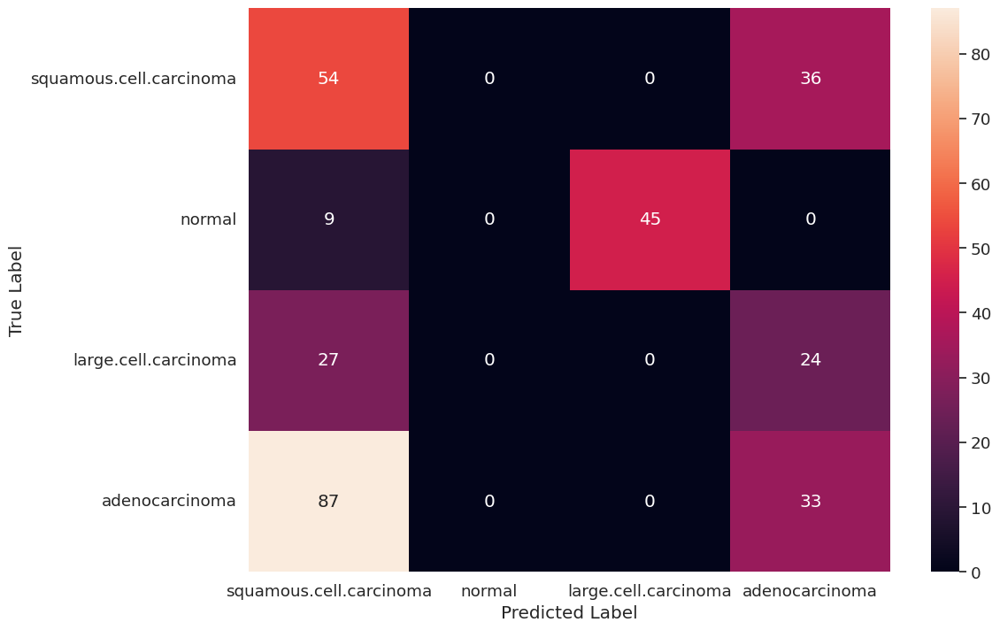

In [46]:
# Creating a heatmap using Seaborn to visualize the confusion matrix
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')

# Setting labels for the x-axis and y-axis
ax.set(xlabel='Predicted Label', ylabel='True Label')

# Displaying the heatmap
plt.show()


In [47]:
# Evaluating the model on the test dataset
result = model.evaluate(test_ds)

# Creating a dictionary to display evaluation metrics
evaluation_dict = dict(zip(model.metrics_names, result))


10/10 [==============================] - 4s 265ms/step - loss: 0.9609 - accuracy: 0.5333 - precision: 0.8333 - recall: 0.1429


Model Tuning - Solving Overfitting

In [125]:
# Creating an augmentation sequence using TensorFlow's Sequential model
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),  # Randomly flip images horizontally and vertically
    tf.keras.layers.RandomRotation(0.2),                    # Randomly rotate images by a factor of 0.2 radians
    tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2)  # Randomly translate images
])

# Using the training dataset for augmentation
aug_ds = train_ds

# Applying the augmentation to each image in the training dataset
for image, label in aug_ds:
    image = augmentation(image)



In [126]:
# Creating a revamped model using TensorFlow's Keras Sequential API
model_revamp = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.InputLayer(input_shape=[image_size[0], image_size[1], 3]),

    # Convolutional layers with BatchNormalization and MaxPooling
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), padding='Same', activation='relu'),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), padding='Same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), padding='Same', activation='relu'),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), padding='Same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), padding='Same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    # Global Average Pooling and Dropout for regularization
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.2),

    # Output layer with softmax activation for multi-class classification
    tf.keras.layers.Dense(4, activation='softmax')
])


In [127]:
# Compiling the revamped model
model_revamp.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),  # Adam optimizer with specified learning rate
    loss=tf.keras.losses.CategoricalCrossentropy(),          # Categorical Crossentropy loss for multi-class classification
    metrics=['accuracy', 'Precision', 'Recall']              # Evaluation metrics to monitor during training
)


In [128]:
# Setting up TensorBoard callback for visualization
log_dir_2 = "logs/Custom_CNN_revamp"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_2, histogram_freq=1)

# Setting up ModelCheckpoint callback to save the best model during training
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("CNN_best.h5", save_best_only=True)

# Setting up EarlyStopping callback to stop training if the validation loss does not improve after a certain number of epochs
early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',       # Monitoring validation loss
    patience=5,                # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restoring the best weights when early stopping is triggered
)


In [129]:
# Training the revamped model with callbacks
history_0 = model_revamp.fit(
    train_ds,  # Augmented training dataset
    epochs=20,  # Number of training epochs
    validation_data=valid_ds,  # Validation dataset
    callbacks=[tensorboard_cb, checkpoint_cb] #early_stopping_cb]  # Callbacks for monitoring and saving
)


Epoch 1/20
20/20 [==============================] - 9s 214ms/step - loss: 1.0949 - accuracy: 0.4943 - precision: 0.6800 - recall: 0.1941 - val_loss: 1.3806 - val_accuracy: 0.2778 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 5s 209ms/step - loss: 0.9427 - accuracy: 0.5661 - precision: 0.7077 - recall: 0.3279 - val_loss: 1.3736 - val_accuracy: 0.3056 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
20/20 [==============================] - 7s 223ms/step - loss: 0.9120 - accuracy: 0.5726 - precision: 0.6709 - recall: 0.3458 - val_loss: 1.3880 - val_accuracy: 0.3056 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
20/20 [==============================] - 5s 182ms/step - loss: 0.8897 - accuracy: 0.5889 - precision: 0.6788 - recall: 0.3654 - val_loss: 1.4154 - val_accuracy: 0.3333 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/20
20/20 [==============================] - 5s 204ms/step - loss: 0.8825 - accuracy: 0.5905 - precision: 0.7152 - recall: 0.3850 - val_loss: 1.4493 - val_accuracy: 0.3056 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 6/20
20/20 [==============================] - 6s 213ms/step - loss: 0.8618 - 

In [130]:
# Evaluating the revamped model on the test dataset
result = model_revamp.evaluate(test_ds)

# Creating a dictionary to display evaluation metrics
evaluation_dict_revamp = dict(zip(model_revamp.metrics_names, result))


10/10 [==============================] - 2s 68ms/step - loss: 1.9563 - accuracy: 0.2857 - precision: 0.3051 - recall: 0.2857


In [131]:
# Initializing variables to count the number of correct predictions for each class
squamous_cell_carcinoma, normal, large_cell_carcinoma, adenocarcinoma = 0, 0, 0, 0

# Lists to store prediction results for further analysis
l1, l2, l3, l4 = [], [], [], []


In [132]:
# Counting predictions for each class and updating the provided lists
conf_mat(squamous_cell_carcinoma_path, l1, model_revamp)
conf_mat(normal_path, l2, model_revamp)
conf_mat(large_cell_carcinoma_path, l3, model_revamp)
conf_mat(adenocarcinoma_path, l4, model_revamp)


1/1 [==============================] - 0s 19ms/step


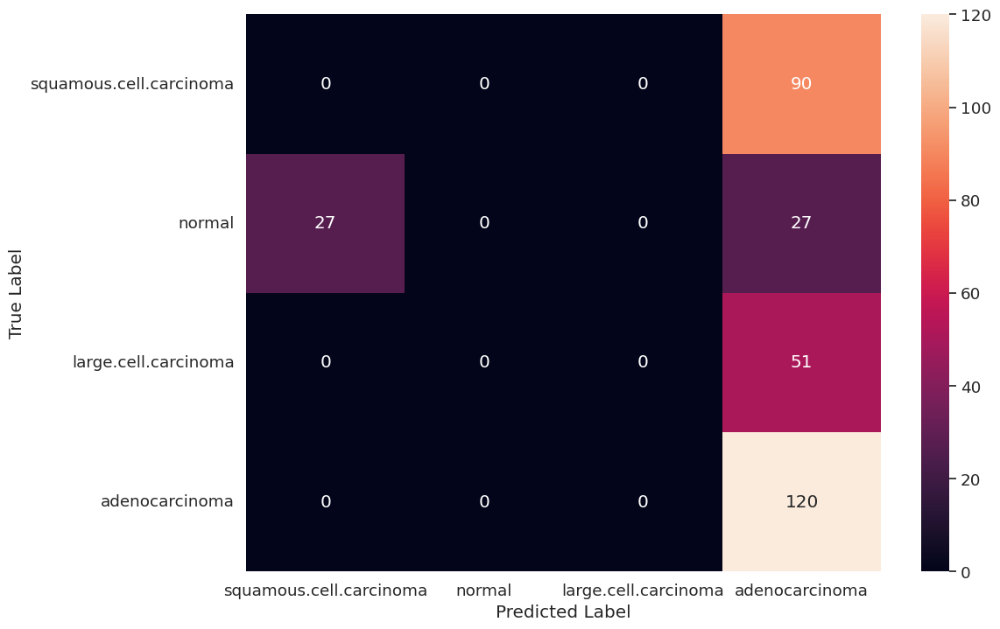

In [134]:
# Creating a heatmap using Seaborn to visualize the confusion matrix
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')

# Setting labels for the x-axis and y-axis
ax.set(xlabel='Predicted Label', ylabel='True Label')

# Displaying the heatmap
plt.show()


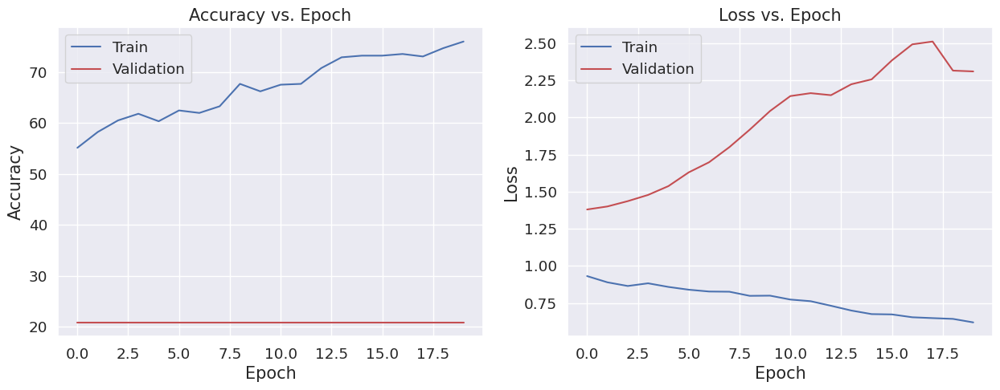

In [69]:
# Plotting accuracy and loss using the custom function
plot_acc_loss(history_0, n_epochs=20)


In [135]:
classwise_accuracy(squamous_cell_carcinoma_path, 'squamous.cell.carcinoma', model_revamp)
classwise_accuracy(normal_path, 'normal', model_revamp)
classwise_accuracy(large_cell_carcinoma_path, 'large.cell.carcinoma', model_revamp)
classwise_accuracy(adenocarcinoma_path, 'adenocarcinoma', model_revamp)


1/1 [==============================] - 0s 21ms/step
Accuracy for class squamous.cell.carcinoma is 0.0% consisting of 90 images
1/1 [==============================] - 0s 18ms/step
Accuracy for class normal is 0.0% consisting of 54 images
1/1 [==============================] - 0s 18ms/step
Accuracy for class large.cell.carcinoma is 0.0% consisting of 51 images
1/1 [==============================] - 0s 27ms/step
Accuracy for class adenocarcinoma is 100.0% consisting of 120 images


VGG 19 Model

In [136]:
# Initializing VGG19 model without the top classification layers
base_model_3 = tf.keras.applications.vgg19.VGG19(input_shape=(256, 256, 3), include_top=False)


In [137]:
model_3 = base_model_3.output

model_3 = tf.keras.Sequential([

    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.InputLayer(input_shape=[image_size[0], image_size[1], 3]),
    base_model_3,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.1),

    tf.keras.layers.Dense(4, activation='softmax')

])


In [138]:
# Compiling the model_3
model_3.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),  # Adam optimizer with specified learning rate
    loss=tf.keras.losses.CategoricalCrossentropy(),          # Categorical Crossentropy loss for multi-class classification
    metrics=['accuracy', 'Precision', 'Recall']              # Evaluation metrics to monitor during training
)


In [139]:
# Setting up TensorBoard callback for visualization
log_dir_5 = "logs/VGG19"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_5, histogram_freq=1)

# Setting up ModelCheckpoint callback to save the best model during training
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("VGG19", save_best_only=True)

# Setting up EarlyStopping callback to stop training if the validation loss does not improve after a certain number of epochs
early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',       # Monitoring validation loss
    patience=5,                # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restoring the best weights when early stopping is triggered
)


In [141]:
# Training model_3 with callbacks
history_3 = model_3.fit(
    train_ds,  # Augmented training dataset
    epochs=20,  # Number of training epochs
    validation_data=valid_ds,  # Validation dataset
    callbacks=[tensorboard_cb, checkpoint_cb]# early_stopping_cb]  # Callbacks for monitoring and saving
)


Epoch 1/20
20/20 [==============================] - 29s 1s/step - loss: 1.4011 - accuracy: 0.3148 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.3479 - val_accuracy: 0.4306 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
20/20 [==============================] - 18s 856ms/step - loss: 1.1803 - accuracy: 0.4339 - precision: 0.7259 - recall: 0.1599 - val_loss: 1.3801 - val_accuracy: 0.3194 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
20/20 [==============================] - 23s 1s/step - loss: 1.1123 - accuracy: 0.4959 - precision: 0.8071 - recall: 0.1843 - val_loss: 1.0061 - val_accuracy: 0.5000 - val_precision: 1.0000 - val_recall: 0.1806
Epoch 4/20
20/20 [==============================] - 23s 1s/step - loss: 1.0063 - accuracy: 0.5106 - precision: 0.6667 - recall: 0.3002 - val_loss: 0.9372 - val_accuracy: 0.4722 - val_precision: 1.0000 - val_recall: 0.1806
Epoch 5/20
20/20 [==============================] - 19s 890ms/step - loss: 0.9034 - a

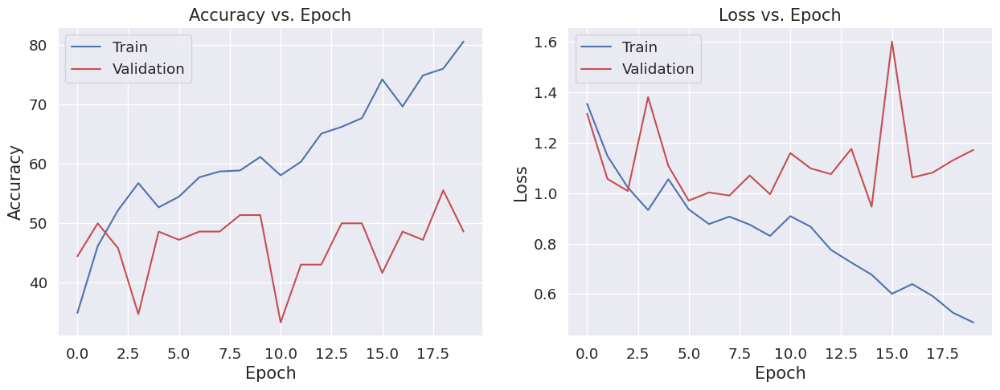

In [79]:
# Plotting accuracy and loss using the custom function
plot_acc_loss(history_3, n_epochs=20)


In [81]:
classwise_accuracy(squamous_cell_carcinoma_path, 'squamous.cell.carcinoma', model_3)
classwise_accuracy(normal_path, 'normal', model_3)
classwise_accuracy(large_cell_carcinoma_path, 'large.cell.carcinoma', model_3)
classwise_accuracy(adenocarcinoma_path, 'adenocarcinoma', model_3)


1/1 [==============================] - 0s 19ms/step
Accuracy for class squamous.cell.carcinoma is 4.44% consisting of 90 images
1/1 [==============================] - 0s 20ms/step
Accuracy for class normal is 0.0% consisting of 54 images
1/1 [==============================] - 0s 20ms/step
Accuracy for class large.cell.carcinoma is 0.0% consisting of 51 images
1/1 [==============================] - 0s 18ms/step
Accuracy for class adenocarcinoma is 79.17% consisting of 120 images


In [82]:
l1 = []
l2 = []
l3 = []
l4 = []

In [83]:
conf_mat(squamous_cell_carcinoma_path, l1, model_3)
conf_mat(normal_path, l2, model_3)
conf_mat(large_cell_carcinoma_path, l3, model_3)
conf_mat(adenocarcinoma_path, l4, model_3)

1/1 [==============================] - 0s 19ms/step


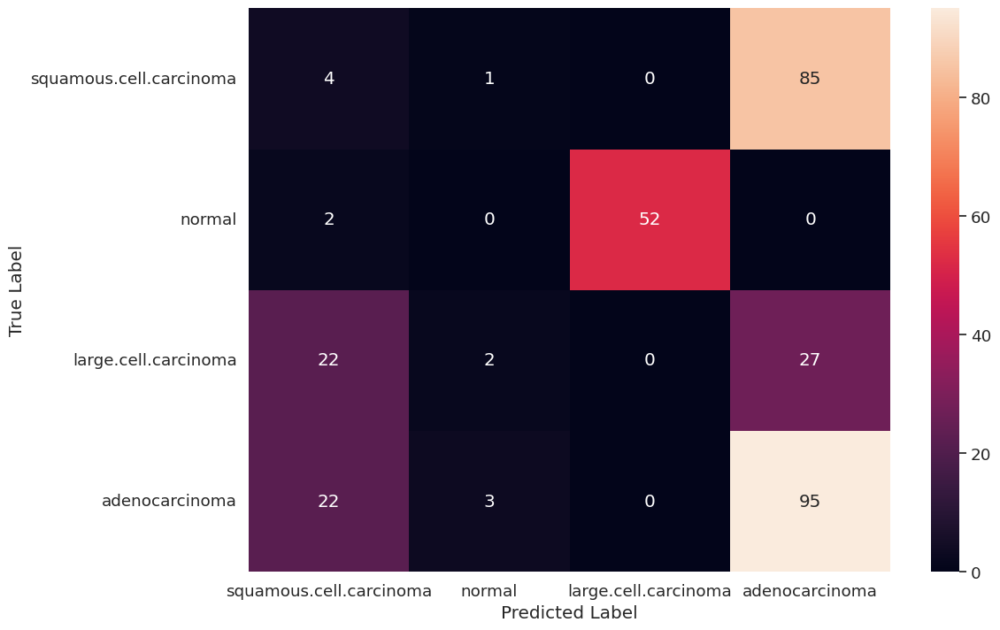

In [86]:
# Creating a heatmap using Seaborn to visualize the confusion matrix
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')

# Setting labels for the x-axis and y-axis
ax.set(xlabel='Predicted Label', ylabel='True Label')

# Displaying the heatmap
plt.show()


In [87]:
result = model_3.evaluate(test_ds)
dict(zip(model_3.metrics_names,result))

10/10 [==============================] - 9s 844ms/step - loss: 1.0467 - accuracy: 0.5111 - precision: 0.5286 - recall: 0.4698


{'loss': 1.046658992767334,
 'accuracy': 0.5111111402511597,
 'precision': 0.5285714268684387,
 'recall': 0.46984127163887024}

Resnet model

In [89]:
# Initializing ResNet50 model without the top classification layers
base_model_1 = tf.keras.applications.resnet50.ResNet50(input_shape=(256, 256, 3), include_top=False)


94765736/94765736 [==============================] - 1s 0us/step


In [91]:
model_1 = base_model_1.output

model_1 = tf.keras.Sequential([

    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.InputLayer(input_shape = [image_size[0],image_size[1],3]),
    base_model_1,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate = 0.1),

    tf.keras.layers.Dense(4, activation = 'softmax')

])

In [92]:
model_1.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy','Precision','Recall'])

In [93]:
log_dir_3 = "logs/resnet50"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_3,histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("ResNet50.h5",save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

In [96]:
history_1 = model_1.fit(
aug_ds,
epochs = 20,
validation_data = valid_ds,
callbacks=[tensorboard_cb, checkpoint_cb])#,early_stopping_cb])

Epoch 1/20
20/20 [==============================] - 17s 788ms/step - loss: 0.0194 - accuracy: 0.9967 - precision: 0.9967 - recall: 0.9951 - val_loss: 1.7322 - val_accuracy: 0.2083 - val_precision: 0.2083 - val_recall: 0.2083
Epoch 2/20
20/20 [==============================] - 16s 748ms/step - loss: 0.0130 - accuracy: 0.9984 - precision: 0.9984 - recall: 0.9984 - val_loss: 1.9618 - val_accuracy: 0.2083 - val_precision: 0.1250 - val_recall: 0.0417
Epoch 3/20
20/20 [==============================] - 17s 751ms/step - loss: 0.0099 - accuracy: 0.9967 - precision: 0.9967 - recall: 0.9967 - val_loss: 1.9895 - val_accuracy: 0.2083 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
20/20 [==============================] - 17s 828ms/step - loss: 0.0067 - accuracy: 0.9984 - precision: 0.9984 - recall: 0.9967 - val_loss: 2.1474 - val_accuracy: 0.2083 - val_precision: 0.0833 - val_recall: 0.0139
Epoch 5/20
20/20 [==============================] - 17s 787ms/step - loss: 0.0079 - accuracy

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 23s 1s/step - loss: 0.0292 - accuracy: 0.9918 - precision: 0.9918 - recall: 0.9918 - val_loss: 1.5693 - val_accuracy: 0.2778 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 10/20
20/20 [==============================] - 23s 1s/step - loss: 0.0671 - accuracy: 0.9788 - precision: 0.9804 - recall: 0.9772 - val_loss: 1.5586 - val_accuracy: 0.2639 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 11/20
20/20 [==============================] - 19s 890ms/step - loss: 0.1262 - accuracy: 0.9641 - precision: 0.9672 - recall: 0.9625 - val_loss: 2.4561 - val_accuracy: 0.0417 - val_precision: 0.0299 - val_recall: 0.0278
Epoch 12/20
20/20 [==============================] - 16s 761ms/step - loss: 0.0599 - accuracy: 0.9853 - precision: 0.9853 - recall: 0.9837 - val_loss: 2.5221 - val_accuracy: 0.3194 - val_precision: 0.3485 - val_recall: 0.3194
Epoch 13/20
20/20 [==============================] - 16s 758ms/step - loss: 0.0178 - accuracy: 0.9

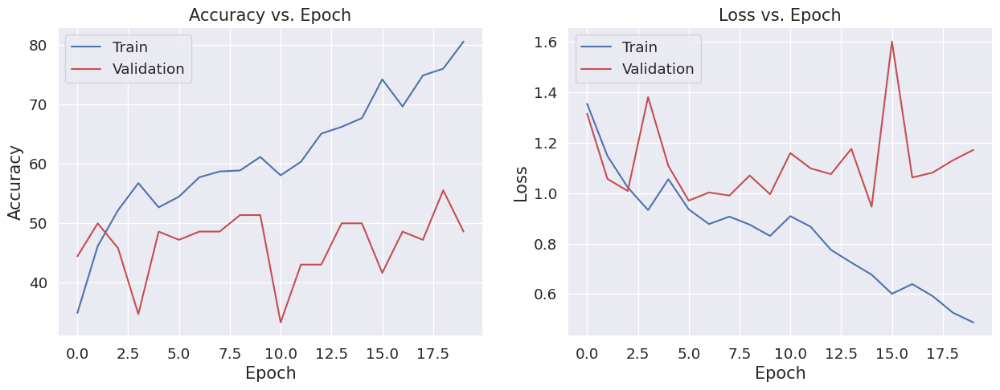

In [97]:
plot_acc_loss(history_3, n_epochs = 20)

In [99]:
classwise_accuracy(squamous_cell_carcinoma_path, 'squamous.cell.carcinoma', model_1)
classwise_accuracy(normal_path, 'normal', model_1)
classwise_accuracy(large_cell_carcinoma_path, 'large.cell.carcinoma', model_1)
classwise_accuracy(adenocarcinoma_path, 'adenocarcinoma', model_1)


1/1 [==============================] - 0s 22ms/step
Accuracy for class squamous.cell.carcinoma is 0.0% consisting of 90 images
1/1 [==============================] - 0s 32ms/step
Accuracy for class normal is 20.37% consisting of 54 images
1/1 [==============================] - 0s 23ms/step
Accuracy for class large.cell.carcinoma is 0.0% consisting of 51 images
1/1 [==============================] - 0s 32ms/step
Accuracy for class adenocarcinoma is 99.17% consisting of 120 images


In [100]:
l1 = []
l2 = []
l3 = []
l4 = []

In [101]:
conf_mat(squamous_cell_carcinoma_path, l1, model_1)
conf_mat(normal_path, l2, model_1)
conf_mat(large_cell_carcinoma_path, l3, model_1)
conf_mat(adenocarcinoma_path, l4, model_1)

1/1 [==============================] - 0s 23ms/step


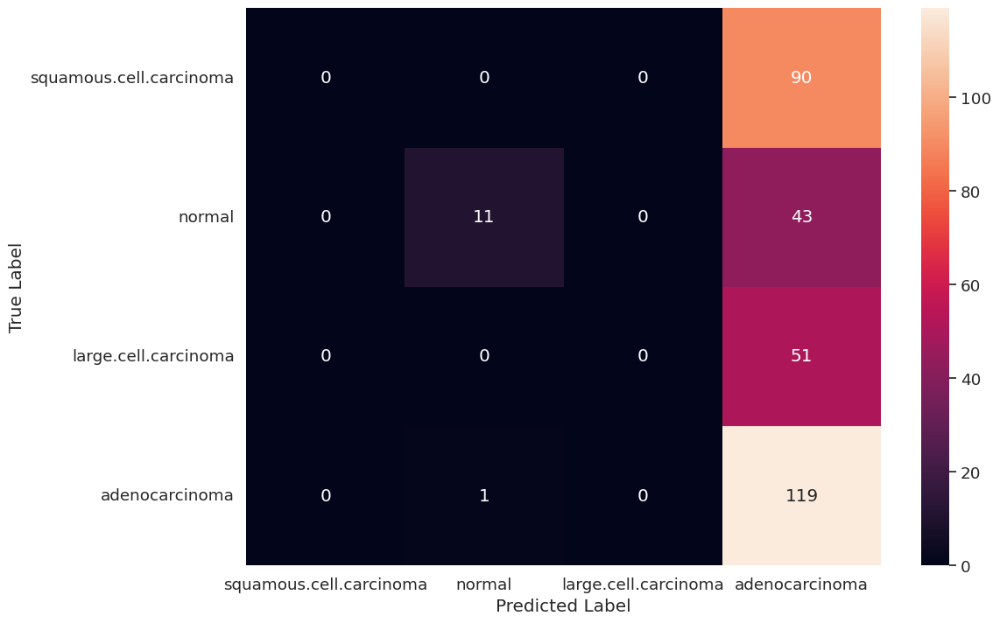

In [103]:
# Creating a heatmap using Seaborn to visualize the confusion matrix
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')

# Setting labels for the x-axis and y-axis
ax.set(xlabel='Predicted Label', ylabel='True Label')

# Displaying the heatmap
plt.show()


In [104]:
result = model_1.evaluate(test_ds)
dict(zip(model_1.metrics_names,result))

10/10 [==============================] - 4s 334ms/step - loss: 1.7881 - accuracy: 0.2857 - precision: 0.3051 - recall: 0.2857


{'loss': 1.7881404161453247,
 'accuracy': 0.2857142984867096,
 'precision': 0.3050847351551056,
 'recall': 0.2857142984867096}

MobileNet Model

In [105]:
# Initializing MobileNet model without the top classification layers
base_model_2 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top=False)


17225924/17225924 [==============================] - 0s 0us/step


In [107]:
model_2 = base_model_2.output

model_2 = tf.keras.Sequential([

    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.InputLayer(input_shape = [image_size[0],image_size[1],3]),
    base_model_2,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate = 0.1),

    tf.keras.layers.Dense(4, activation = 'softmax')

])

In [108]:
model_2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy','Precision','Recall'])

In [109]:
log_dir_4 = "logs/Mobilenet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_4,histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.h5",save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

In [144]:
history_2 = model_2.fit(
aug_ds,
epochs = 30,
validation_data = valid_ds,
callbacks=[tensorboard_cb, checkpoint_cb])#,early_stopping_cb])

Epoch 1/30
20/20 [==============================] - 7s 255ms/step - loss: 0.0062 - accuracy: 0.9984 - precision: 0.9984 - recall: 0.9984 - val_loss: 0.4669 - val_accuracy: 0.8333 - val_precision: 0.8451 - val_recall: 0.8333
Epoch 2/30
20/20 [==============================] - 6s 236ms/step - loss: 0.0057 - accuracy: 0.9984 - precision: 0.9984 - recall: 0.9984 - val_loss: 0.6078 - val_accuracy: 0.8056 - val_precision: 0.8286 - val_recall: 0.8056
Epoch 3/30
20/20 [==============================] - 6s 238ms/step - loss: 0.0074 - accuracy: 0.9967 - precision: 0.9967 - recall: 0.9967 - val_loss: 0.6129 - val_accuracy: 0.7917 - val_precision: 0.7917 - val_recall: 0.7917
Epoch 4/30
20/20 [==============================] - 7s 294ms/step - loss: 0.0183 - accuracy: 0.9935 - precision: 0.9935 - recall: 0.9935 - val_loss: 0.5816 - val_accuracy: 0.7917 - val_precision: 0.8261 - val_recall: 0.7917
Epoch 5/30
20/20 [==============================] - 6s 250ms/step - loss: 0.0327 - accuracy: 0.9918 - pr

In [111]:
model_2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 input_8 (InputLayer)        multiple                  0         
                                                                 
 mobilenet_1.00_224 (Functi  (None, 8, 8, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_4  (None, 1024)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 4)                

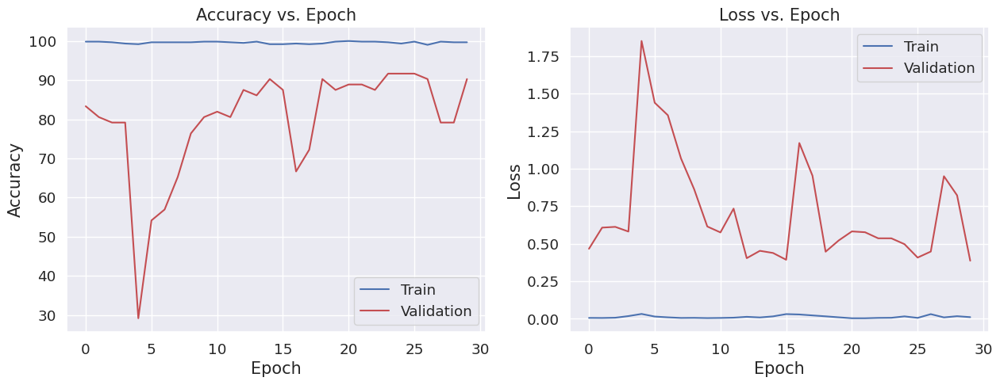

In [150]:
plot_acc_loss(history_2, n_epochs = 30)

In [114]:
classwise_accuracy(squamous_cell_carcinoma_path, 'squamous.cell.carcinoma', model_2)
classwise_accuracy(normal_path, 'normal', model_2)
classwise_accuracy(large_cell_carcinoma_path, 'large.cell.carcinoma', model_2)
classwise_accuracy(adenocarcinoma_path, 'adenocarcinoma', model_2)


1/1 [==============================] - 0s 32ms/step
Accuracy for class squamous.cell.carcinoma is 37.78% consisting of 90 images
1/1 [==============================] - 0s 19ms/step
Accuracy for class normal is 0.0% consisting of 54 images
1/1 [==============================] - 0s 19ms/step
Accuracy for class large.cell.carcinoma is 0.0% consisting of 51 images
1/1 [==============================] - 0s 19ms/step
Accuracy for class adenocarcinoma is 1.67% consisting of 120 images


In [115]:
l1 = []
l2 = []
l3 = []
l4 = []

In [116]:

conf_mat(squamous_cell_carcinoma_path, l1, model_2)
conf_mat(normal_path, l2, model_2)
conf_mat(large_cell_carcinoma_path, l3, model_2)
conf_mat(adenocarcinoma_path, l4, model_2)

1/1 [==============================] - 0s 34ms/step


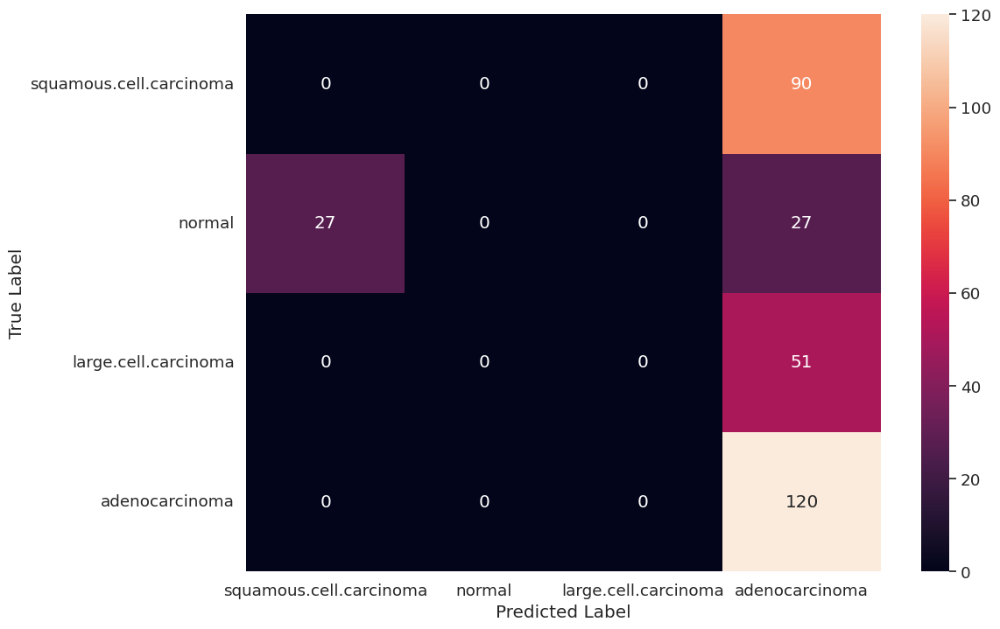

In [145]:
# Creating a heatmap using Seaborn to visualize the confusion matrix
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')

# Setting labels for the x-axis and y-axis
ax.set(xlabel='Predicted Label', ylabel='True Label')

# Displaying the heatmap
plt.show()


In [119]:
result = model_2.evaluate(test_ds)
dict(zip(model_2.metrics_names,result))

10/10 [==============================] - 4s 159ms/step - loss: 0.5949 - accuracy: 0.7841 - precision: 0.7941 - recall: 0.7714


{'loss': 0.5949452519416809,
 'accuracy': 0.7841269969940186,
 'precision': 0.7941176295280457,
 'recall': 0.7714285850524902}

Model Comparison

In [146]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Data-20240107T131020Z-001/Data/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>



Testing OUR best model(Mobilenet)


In [147]:
model_2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 input_8 (InputLayer)        multiple                  0         
                                                                 
 mobilenet_1.00_224 (Functi  (None, 8, 8, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_4  (None, 1024)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 4)                

1/1 [==============================] - 0s 130ms/step


<ipython-input-36-43a844070fe7>:28: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 4, n)


1/1 [==============================] - 0s 63ms/step


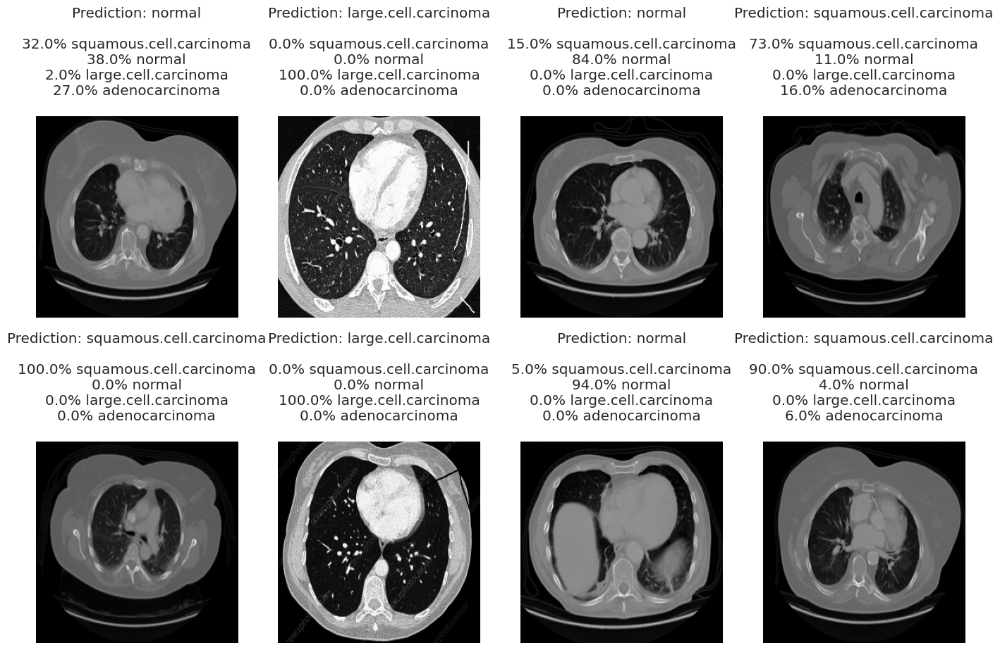

In [148]:
grid_test_model(model_2)

In [149]:
result = model_2.evaluate(test_ds)
dict(zip(model_2.metrics_names,result))

10/10 [==============================] - 2s 66ms/step - loss: 0.5083 - accuracy: 0.8222 - precision: 0.8344 - recall: 0.8159


{'loss': 0.5083220601081848,
 'accuracy': 0.8222222328186035,
 'precision': 0.8344155550003052,
 'recall': 0.8158730268478394}